# **Food/Fruit Recognition and Calorie Estimation**
## **Part A Food or Fruit Classification**

## **Importing necessary libraries**

In [ ]:
import os
import numpy as np
import cv2
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix, classification_report, accuracy_score
from sklearn.utils.class_weight import compute_class_weight
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms, models
from matplotlib.gridspec import GridSpec
from scipy import ndimage
from sklearn.decomposition import PCA
from collections import Counter
import warnings
warnings.filterwarnings('ignore')

plt.style.use('seaborn-v0_8-darkgrid')
sns.set_palette("husl")
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f"Using device: {device}")

Using device: cuda


## **CONFIGURATION**

In [ ]:
PROJECT_DATA_PATH = '/kaggle/input/datasets-cv/Project Data'
FOOD_PATH = os.path.join(PROJECT_DATA_PATH, 'Food')
FRUIT_PATH = os.path.join(PROJECT_DATA_PATH, 'Fruit')
FOOD_TRAIN_PATH = os.path.join(FOOD_PATH, 'Train')
FOOD_VAL_PATH = os.path.join(FOOD_PATH, 'Validation')
FRUIT_TRAIN_PATH = os.path.join(FRUIT_PATH, 'Train')
FRUIT_VAL_PATH = os.path.join(FRUIT_PATH, 'Validation')

## **FOOD DATASET OVERVIEW (STRUCTURE & CATEGORY DISTRIBUTION)**[link text](https://)

In [ ]:
print("=" * 60)
print("FOOD DATASET OVERVIEW (STRUCTURE & CATEGORY DISTRIBUTION)")
print("=" * 60)

print("=" * 50)
print("FOOD DATASET STRUCTURE")
print("=" * 50)

food_train_categories = sorted(os.listdir(FOOD_TRAIN_PATH))
food_val_categories = sorted(os.listdir(FOOD_VAL_PATH))

print(f"\nNumber of Food Training Categories: {len(food_train_categories)}")
print(f"Number of Food Validation Categories: {len(food_val_categories)}")

print("\nTraining Categories:")
for i, category in enumerate(food_train_categories, 1):
    train_images = len(os.listdir(os.path.join(FOOD_TRAIN_PATH, category)))
    print(f"{i}. {category}: {train_images} train images")

print("\nValidation Categories:")
for i, category in enumerate(food_val_categories, 1):
    val_images = len(os.listdir(os.path.join(FOOD_VAL_PATH, category)))
    print(f"{i}. {category}: {val_images} val images")


FOOD DATASET STRUCTURE

Number of Food Training Categories: 85
Number of Food Validation Categories: 8

Training Categories:
1. apple_pie: 45 train images
2. baby_back_ribs: 33 train images
3. baklava: 11 train images
4. beef_carpaccio: 46 train images
5. beef_tartare: 44 train images
6. beet_salad: 45 train images
7. beignets: 44 train images
8. bibimbap: 48 train images
9. bread_pudding: 27 train images
10. breakfast_burrito: 38 train images
11. caesar_salad: 35 train images
12. cannoli: 15 train images
13. caprese_salad: 35 train images
14. carrot_cake: 12 train images
15. cheese_plate: 16 train images
16. cheesecake: 12 train images
17. chicken_curry: 15 train images
18. chicken_quesadilla: 43 train images
19. chicken_wings: 16 train images
20. chocolate_cake: 49 train images
21. chocolate_mousse: 38 train images
22. churros: 10 train images
23. clam_chowder: 12 train images
24. club_sandwich: 30 train images
25. croque_madame: 14 train images
26. cup_cakes: 23 train images
27. dev

In [ ]:
def load_food_images(data_path, categories, max_images_per_category=None):
    """
    Load food images from the dataset
    """
    images = []
    labels = []

    for category in categories:
        category_path = os.path.join(data_path, category)
        image_files = os.listdir(category_path)

        if max_images_per_category:
            image_files = image_files[:max_images_per_category]

        for img_file in image_files:
            if img_file.endswith('.jpg') or img_file.endswith('.jpeg') or img_file.endswith('.png'):
                img_path = os.path.join(category_path, img_file)
                try:
                    img = cv2.imread(img_path)
                    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
                    images.append(img)
                    labels.append(category)
                except Exception as e:
                    print(f"Error loading {img_path}: {e}")

    return images, labels

print("Food image loading function defined!")

Food image loading function defined!


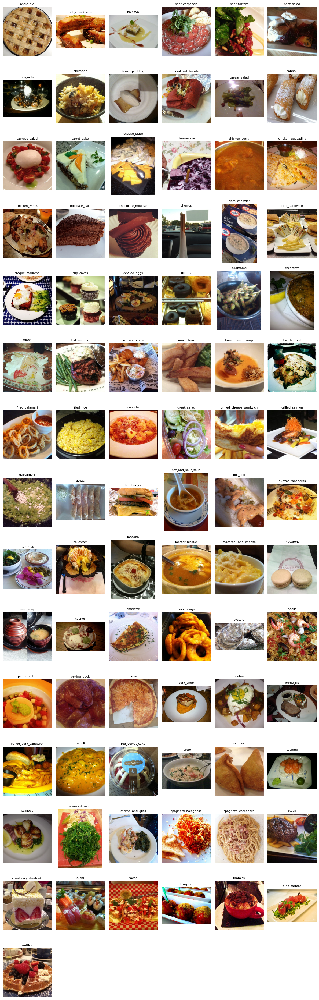

In [ ]:
import math
# Load images
sample_images, sample_labels = load_food_images(
    FOOD_TRAIN_PATH,
    food_train_categories,
    max_images_per_category=1
)

num_samples = len(sample_images)

cols = 6
rows = math.ceil(num_samples / cols)

plt.figure(figsize=(12, rows * 2.5))

for i in range(num_samples):
    plt.subplot(rows, cols, i + 1)
    plt.imshow(sample_images[i])
    plt.title(sample_labels[i], fontsize=8)
    plt.axis("off")

plt.tight_layout()
plt.show()


In [ ]:
print("Loading sample food images...")
sample_food_train_images, sample_food_train_labels = load_food_images(
    FOOD_TRAIN_PATH,
    food_train_categories[:5],  # Load first 5 categories
    max_images_per_category=5
)

print(f"Loaded {len(sample_food_train_images)} food training images")
print(f"Unique labels: {set(sample_food_train_labels)}")

Loading sample food images...
Loaded 25 food training images
Unique labels: {'baby_back_ribs', 'apple_pie', 'beef_tartare', 'beef_carpaccio', 'baklava'}


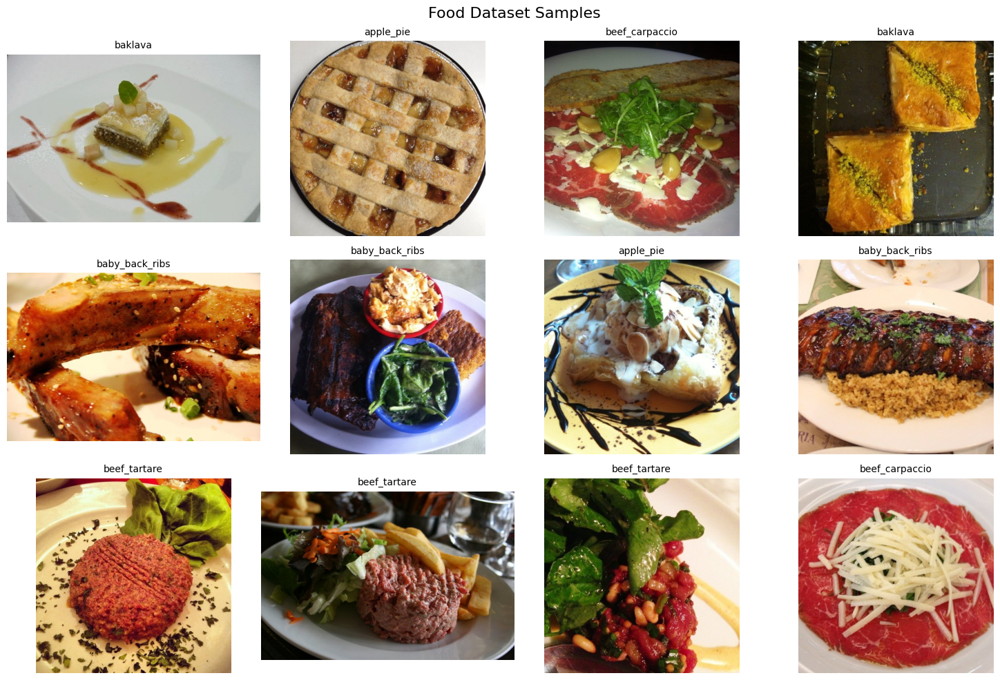

In [ ]:
import random
def visualize_food_samples(images, labels, num_samples=12):
    """
    Visualize random food samples
    """
    num_samples = min(num_samples, len(images))
    indices = random.sample(range(len(images)), num_samples)

    rows = 3
    cols = 4
    fig, axes = plt.subplots(rows, cols, figsize=(15, 10))
    fig.suptitle('Food Dataset Samples', fontsize=16)

    for idx, ax in enumerate(axes.flat):
        if idx < num_samples:
            img_idx = indices[idx]
            ax.imshow(images[img_idx])
            ax.set_title(f"{labels[img_idx]}", fontsize=10)
            ax.axis('off')
        else:
            ax.axis('off')

    plt.tight_layout()
    plt.show()

if len(sample_food_train_images) > 0:
    visualize_food_samples(sample_food_train_images, sample_food_train_labels)

## **## **Fruit DATASET OVERVIEW (STRUCTURE & CATEGORY DISTRIBUTION)**

In [ ]:
print("=" * 50)
print("FRUIT DATASET STRUCTURE")
print("=" * 50)

fruit_train_categories = sorted(os.listdir(FRUIT_TRAIN_PATH))
fruit_val_categories = sorted(os.listdir(FRUIT_VAL_PATH))

print(f"\nNumber of Fruit Training Categories: {len(fruit_train_categories)}")
print(f"Number of Fruit Validation Categories: {len(fruit_val_categories)}")

print("\nFruit Categories:")
for i, category in enumerate(fruit_train_categories, 1):
    train_images_path = os.path.join(FRUIT_TRAIN_PATH, category, 'Images')
    val_images_path = os.path.join(FRUIT_VAL_PATH, category, 'Images')

    train_images = len(os.listdir(train_images_path)) if os.path.exists(train_images_path) else 0
    val_images = len(os.listdir(val_images_path)) if os.path.exists(val_images_path) else 0

    print(f"{i}. {category}: {train_images} train images, {val_images} val images")

FRUIT DATASET STRUCTURE

Number of Fruit Training Categories: 30
Number of Fruit Validation Categories: 30

Fruit Categories:
1. Apple_Gala: 58 train images, 5 val images
2. Apple_Golden Delicious: 50 train images, 5 val images
3. Avocado: 65 train images, 5 val images
4. Banana: 75 train images, 5 val images
5. Berry: 55 train images, 5 val images
6. Burmese Grape: 71 train images, 5 val images
7. Carambola: 93 train images, 5 val images
8. Date Palm: 140 train images, 5 val images
9. Dragon: 89 train images, 5 val images
10. Elephant Apple: 74 train images, 5 val images
11. Grape: 75 train images, 5 val images
12. Green Coconut: 30 train images, 5 val images
13. Guava: 48 train images, 5 val images
14. Hog Plum: 84 train images, 5 val images
15. Kiwi: 54 train images, 5 val images
16. Lichi: 41 train images, 5 val images
17. Malta: 43 train images, 5 val images
18. Mango Golden Queen: 9 train images, 5 val images
19. Mango_Alphonso: 38 train images, 5 val images
20. Mango_Amrapali: 6

In [ ]:
def load_fruit_images_and_masks(data_path, categories, max_images_per_category=None):
    """
    Load fruit images and their corresponding masks
    Image: 1.jpg -> Mask: 1_mask.png
    """
    images = []
    masks = []
    labels = []

    for category in categories:
        images_path = os.path.join(data_path, category, 'Images')
        masks_path = os.path.join(data_path, category, 'Mask')

        if os.path.exists(images_path) and os.path.exists(masks_path):
            image_files = sorted(os.listdir(images_path))

            if max_images_per_category:
                image_files = image_files[:max_images_per_category]

            for img_file in image_files:
                if img_file.endswith('.jpg') or img_file.endswith('.jpeg'):
                    img_path = os.path.join(images_path, img_file)


                    base_name = os.path.splitext(img_file)[0]
                    mask_file = f"{base_name}_mask.png"
                    mask_path = os.path.join(masks_path, mask_file)

                    try:
                        img = cv2.imread(img_path)
                        if img is None:
                            print(f"Failed to load image: {img_path}")
                            continue
                        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

                        if os.path.exists(mask_path):
                            mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)
                            if mask is None:
                                print(f"Failed to load mask: {mask_path}")
                                continue
                            images.append(img)
                            masks.append(mask)
                            labels.append(category)
                        else:
                            print(f"Mask not found: {mask_path}")
                    except Exception as e:
                        print(f"Error loading {img_path}: {e}")

    return images, masks, labels

print("Fruit image and mask loading function defined!")

Fruit image and mask loading function defined!


In [ ]:
print("Loading sample fruit images and masks...")
sample_fruit_train_images, sample_fruit_train_masks, sample_fruit_train_labels = load_fruit_images_and_masks(
    FRUIT_TRAIN_PATH,
    fruit_train_categories[:5],  # Load first 5 categories
    max_images_per_category=5
)

print(f"Loaded {len(sample_fruit_train_images)} fruit training images")
print(f"Unique labels: {set(sample_fruit_train_labels)}")

Loading sample fruit images and masks...
Loaded 25 fruit training images
Unique labels: {'Apple_Gala', 'Avocado', 'Banana', 'Apple_Golden Delicious', 'Berry'}


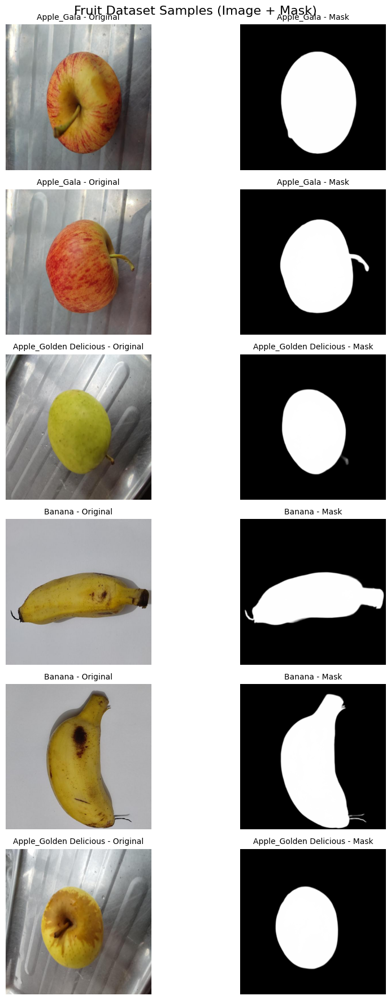

In [ ]:
def visualize_fruit_samples_with_masks(images, masks, labels, num_samples=6):
    """
    Visualize fruit images alongside their masks
    """
    num_samples = min(num_samples, len(images))
    indices = random.sample(range(len(images)), num_samples)

    rows = num_samples
    cols = 2
    fig, axes = plt.subplots(rows, cols, figsize=(10, 3*num_samples))
    fig.suptitle('Fruit Dataset Samples (Image + Mask)', fontsize=16)

    for idx, img_idx in enumerate(indices):

        axes[idx, 0].imshow(images[img_idx])
        axes[idx, 0].set_title(f"{labels[img_idx]} - Original", fontsize=10)
        axes[idx, 0].axis('off')


        axes[idx, 1].imshow(masks[img_idx], cmap='gray')
        axes[idx, 1].set_title(f"{labels[img_idx]} - Mask", fontsize=10)
        axes[idx, 1].axis('off')

    plt.tight_layout()
    plt.show()

if len(sample_fruit_train_images) > 0:
    visualize_fruit_samples_with_masks(
        sample_fruit_train_images,
        sample_fruit_train_masks,
        sample_fruit_train_labels
    )

## **Dataset Statistics**

In [ ]:
def get_dataset_statistics():
    """
    Get comprehensive statistics about the dataset
    """
    stats = {
        'food': {
            'train': {},
            'val': {}
        },
        'fruit': {
            'train': {},
            'val': {}
        }
    }

    # Food statistics
    for category in food_train_categories:
        train_path = os.path.join(FOOD_TRAIN_PATH, category)
        stats['food']['train'][category] = len(os.listdir(train_path))

    for category in food_val_categories:
        val_path = os.path.join(FOOD_VAL_PATH, category)
        stats['food']['val'][category] = len(os.listdir(val_path))

    # Fruit statistics
    for category in fruit_train_categories:
        images_path = os.path.join(FRUIT_TRAIN_PATH, category, 'Images')
        if os.path.exists(images_path):
            stats['fruit']['train'][category] = len(os.listdir(images_path))

    for category in fruit_val_categories:
        images_path = os.path.join(FRUIT_VAL_PATH, category, 'Images')
        if os.path.exists(images_path):
            stats['fruit']['val'][category] = len(os.listdir(images_path))

    return stats

# Get statistics
dataset_stats = get_dataset_statistics()

print("=" * 50)
print("DATASET STATISTICS")
print("=" * 50)
print(f"\nTotal Food Categories: {len(food_train_categories)}")
print(f"Total Food Training Images: {sum(dataset_stats['food']['train'].values())}")
print(f"Total Food Validation Images: {sum(dataset_stats['food']['val'].values())}")

print(f"\nTotal Fruit Categories: {len(fruit_train_categories)}")
print(f"Total Fruit Training Images: {sum(dataset_stats['fruit']['train'].values())}")
print(f"Total Fruit Validation Images: {sum(dataset_stats['fruit']['val'].values())}")

total_images = (sum(dataset_stats['food']['train'].values()) +
                sum(dataset_stats['food']['val'].values()) +
                sum(dataset_stats['fruit']['train'].values()) +
                sum(dataset_stats['fruit']['val'].values()))

print(f"\nTotal Images in Dataset: {total_images}")

DATASET STATISTICS

Total Food Categories: 85
Total Food Training Images: 2538
Total Food Validation Images: 261

Total Fruit Categories: 30
Total Fruit Training Images: 1759
Total Fruit Validation Images: 150

Total Images in Dataset: 4708


## **Viisualizations**

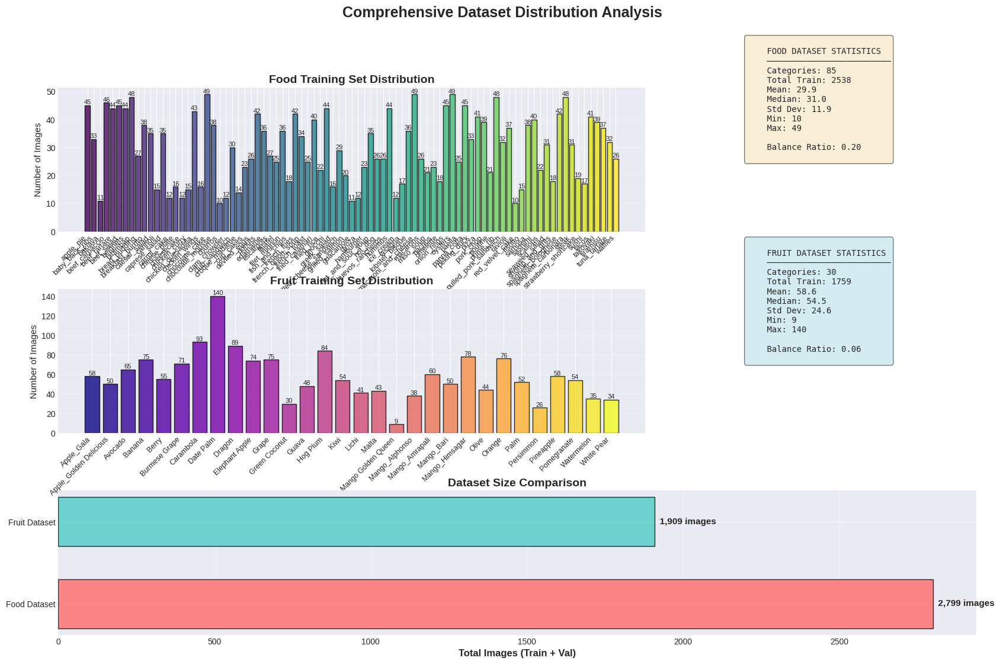

In [ ]:
# ========================================================================================
# 1. ADVANCED DISTRIBUTION ANALYSIS WITH INTERACTIVE ELEMENTS
# ========================================================================================

def plot_advanced_distribution():
    """
    Multi-panel distribution analysis with statistical insights
    """
    fig = plt.figure(figsize=(20, 12))
    gs = GridSpec(3, 3, figure=fig, hspace=0.4, wspace=0.3)

    ax1 = fig.add_subplot(gs[0, :2])
    food_train_counts = [dataset_stats['food']['train'][cat] for cat in food_train_categories]
    colors = plt.cm.viridis(np.linspace(0, 1, len(food_train_categories)))
    bars1 = ax1.bar(range(len(food_train_categories)), food_train_counts, color=colors, alpha=0.8, edgecolor='black')
    ax1.set_xticks(range(len(food_train_categories)))
    ax1.set_xticklabels(food_train_categories, rotation=45, ha='right', fontsize=9)
    ax1.set_title('Food Training Set Distribution', fontsize=14, fontweight='bold')
    ax1.set_ylabel('Number of Images', fontsize=11)
    ax1.grid(axis='y', alpha=0.3)

    for bar in bars1:
        height = bar.get_height()
        ax1.text(bar.get_x() + bar.get_width()/2., height,
                f'{int(height)}', ha='center', va='bottom', fontsize=8)

    ax2 = fig.add_subplot(gs[0, 2])
    ax2.axis('off')
    food_stats_text = f"""
    FOOD DATASET STATISTICS
    ─────────────────────────
    Categories: {len(food_train_categories)}
    Total Train: {sum(food_train_counts)}
    Mean: {np.mean(food_train_counts):.1f}
    Median: {np.median(food_train_counts):.1f}
    Std Dev: {np.std(food_train_counts):.1f}
    Min: {np.min(food_train_counts)}
    Max: {np.max(food_train_counts)}

    Balance Ratio: {np.min(food_train_counts)/np.max(food_train_counts):.2f}
    """
    ax2.text(0.1, 0.5, food_stats_text, fontsize=10, family='monospace',
             bbox=dict(boxstyle='round', facecolor='wheat', alpha=0.5))

    ax3 = fig.add_subplot(gs[1, :2])
    fruit_train_counts = [dataset_stats['fruit']['train'][cat] for cat in fruit_train_categories]
    colors2 = plt.cm.plasma(np.linspace(0, 1, len(fruit_train_categories)))
    bars2 = ax3.bar(range(len(fruit_train_categories)), fruit_train_counts, color=colors2, alpha=0.8, edgecolor='black')
    ax3.set_xticks(range(len(fruit_train_categories)))
    ax3.set_xticklabels(fruit_train_categories, rotation=45, ha='right', fontsize=9)
    ax3.set_title('Fruit Training Set Distribution', fontsize=14, fontweight='bold')
    ax3.set_ylabel('Number of Images', fontsize=11)
    ax3.grid(axis='y', alpha=0.3)

    for bar in bars2:
        height = bar.get_height()
        ax3.text(bar.get_x() + bar.get_width()/2., height,
                f'{int(height)}', ha='center', va='bottom', fontsize=8)

    ax4 = fig.add_subplot(gs[1, 2])
    ax4.axis('off')
    fruit_stats_text = f"""
    FRUIT DATASET STATISTICS
    ─────────────────────────
    Categories: {len(fruit_train_categories)}
    Total Train: {sum(fruit_train_counts)}
    Mean: {np.mean(fruit_train_counts):.1f}
    Median: {np.median(fruit_train_counts):.1f}
    Std Dev: {np.std(fruit_train_counts):.1f}
    Min: {np.min(fruit_train_counts)}
    Max: {np.max(fruit_train_counts)}

    Balance Ratio: {np.min(fruit_train_counts)/np.max(fruit_train_counts):.2f}
    """
    ax4.text(0.1, 0.5, fruit_stats_text, fontsize=10, family='monospace',
             bbox=dict(boxstyle='round', facecolor='lightblue', alpha=0.5))

    ax5 = fig.add_subplot(gs[2, :])
    total_food = sum(food_train_counts) + sum([dataset_stats['food']['val'][cat] for cat in food_val_categories])
    total_fruit = sum(fruit_train_counts) + sum([dataset_stats['fruit']['val'][cat] for cat in fruit_val_categories])

    categories_cmp = ['Food Dataset', 'Fruit Dataset']
    values = [total_food, total_fruit]
    colors_cmp = ['#FF6B6B', '#4ECDC4']

    bars = ax5.barh(categories_cmp, values, color=colors_cmp, alpha=0.8, edgecolor='black', height=0.6)
    ax5.set_xlabel('Total Images (Train + Val)', fontsize=12, fontweight='bold')
    ax5.set_title('Dataset Size Comparison', fontsize=14, fontweight='bold')
    ax5.grid(axis='x', alpha=0.3)

    for i, (bar, val) in enumerate(zip(bars, values)):
        ax5.text(val, bar.get_y() + bar.get_height()/2, f'  {val:,} images',
                va='center', fontsize=11, fontweight='bold')

    plt.suptitle('Comprehensive Dataset Distribution Analysis', fontsize=18, fontweight='bold', y=0.995)
    plt.show()

plot_advanced_distribution()

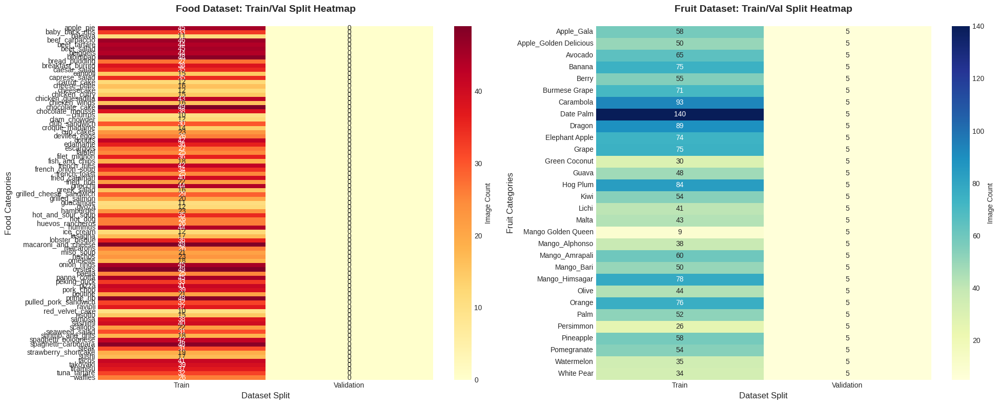

In [ ]:
# ========================================================================================
# 2. HEATMAP OF CLASS DISTRIBUTIONS
# ========================================================================================

def plot_distribution_heatmap():
    """
    Heatmap showing train/val split for all categories
    """
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 8))

    food_data = []
    for cat in food_train_categories:
        train_count = dataset_stats['food']['train'].get(cat, 0)
        val_count = dataset_stats['food']['val'].get(cat, 0)
        food_data.append([train_count, val_count])

    food_data = np.array(food_data)
    sns.heatmap(food_data, annot=True, fmt='d', cmap='YlOrRd',
                xticklabels=['Train', 'Validation'],
                yticklabels=food_train_categories, ax=ax1, cbar_kws={'label': 'Image Count'})
    ax1.set_title('Food Dataset: Train/Val Split Heatmap', fontsize=14, fontweight='bold', pad=20)
    ax1.set_xlabel('Dataset Split', fontsize=12)
    ax1.set_ylabel('Food Categories', fontsize=12)

    fruit_data = []
    for cat in fruit_train_categories:
        train_count = dataset_stats['fruit']['train'].get(cat, 0)
        val_count = dataset_stats['fruit']['val'].get(cat, 0)
        fruit_data.append([train_count, val_count])

    fruit_data = np.array(fruit_data)
    sns.heatmap(fruit_data, annot=True, fmt='d', cmap='YlGnBu',
                xticklabels=['Train', 'Validation'],
                yticklabels=fruit_train_categories, ax=ax2, cbar_kws={'label': 'Image Count'})
    ax2.set_title('Fruit Dataset: Train/Val Split Heatmap', fontsize=14, fontweight='bold', pad=20)
    ax2.set_xlabel('Dataset Split', fontsize=12)
    ax2.set_ylabel('Fruit Categories', fontsize=12)

    plt.tight_layout()
    plt.show()

plot_distribution_heatmap()

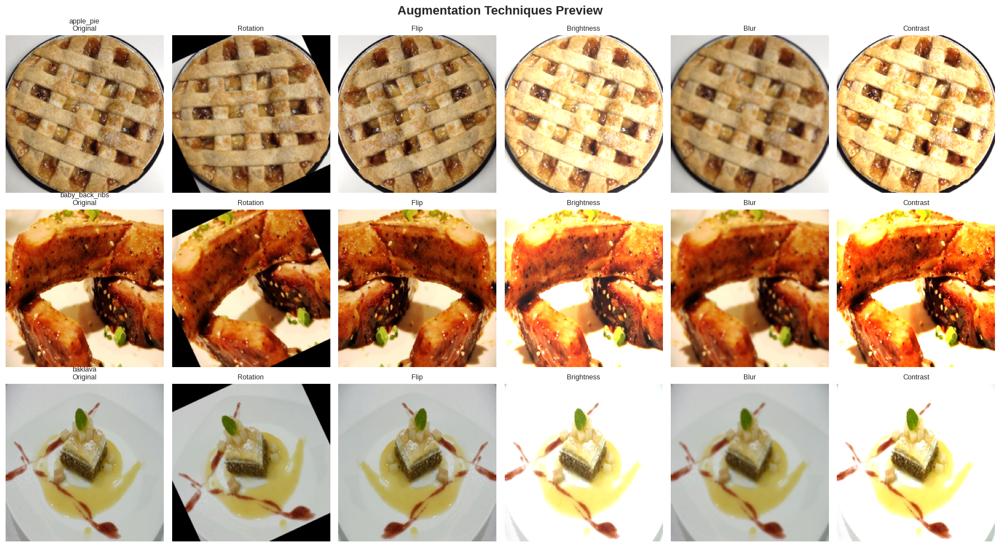

In [ ]:
# ========================================================================================
# 3. ADVANCED IMAGE GRID WITH AUGMENTATION PREVIEW
# ========================================================================================

def plot_augmentation_preview():
    """
    Show original images with various augmentation techniques
    """
    sample_images_food, sample_labels_food = load_food_images(
        FOOD_TRAIN_PATH, food_train_categories[:3], max_images_per_category=1
    )

    fig, axes = plt.subplots(3, 6, figsize=(18, 10))
    fig.suptitle('Augmentation Techniques Preview', fontsize=16, fontweight='bold')

    augmentation_names = ['Original', 'Rotation', 'Flip', 'Brightness', 'Blur', 'Contrast']

    for i, (img, label) in enumerate(zip(sample_images_food, sample_labels_food)):
        if i >= 3:
            break

        img_resized = cv2.resize(img, (224, 224))

        # Original
        axes[i, 0].imshow(img_resized)
        axes[i, 0].set_title(f'{label}\n{augmentation_names[0]}', fontsize=9)
        axes[i, 0].axis('off')

        # Rotation
        rows, cols = img_resized.shape[:2]
        M = cv2.getRotationMatrix2D((cols/2, rows/2), 25, 1)
        rotated = cv2.warpAffine(img_resized, M, (cols, rows))
        axes[i, 1].imshow(rotated)
        axes[i, 1].set_title(augmentation_names[1], fontsize=9)
        axes[i, 1].axis('off')

        # Horizontal flip
        flipped = cv2.flip(img_resized, 1)
        axes[i, 2].imshow(flipped)
        axes[i, 2].set_title(augmentation_names[2], fontsize=9)
        axes[i, 2].axis('off')

        # Brightness adjustment
        bright = cv2.convertScaleAbs(img_resized, alpha=1.3, beta=30)
        axes[i, 3].imshow(bright)
        axes[i, 3].set_title(augmentation_names[3], fontsize=9)
        axes[i, 3].axis('off')

        # Gaussian blur
        blurred = cv2.GaussianBlur(img_resized, (5, 5), 0)
        axes[i, 4].imshow(blurred)
        axes[i, 4].set_title(augmentation_names[4], fontsize=9)
        axes[i, 4].axis('off')

        # Contrast adjustment
        contrast = cv2.convertScaleAbs(img_resized, alpha=1.5, beta=0)
        axes[i, 5].imshow(contrast)
        axes[i, 5].set_title(augmentation_names[5], fontsize=9)
        axes[i, 5].axis('off')

    plt.tight_layout()
    plt.show()

plot_augmentation_preview()

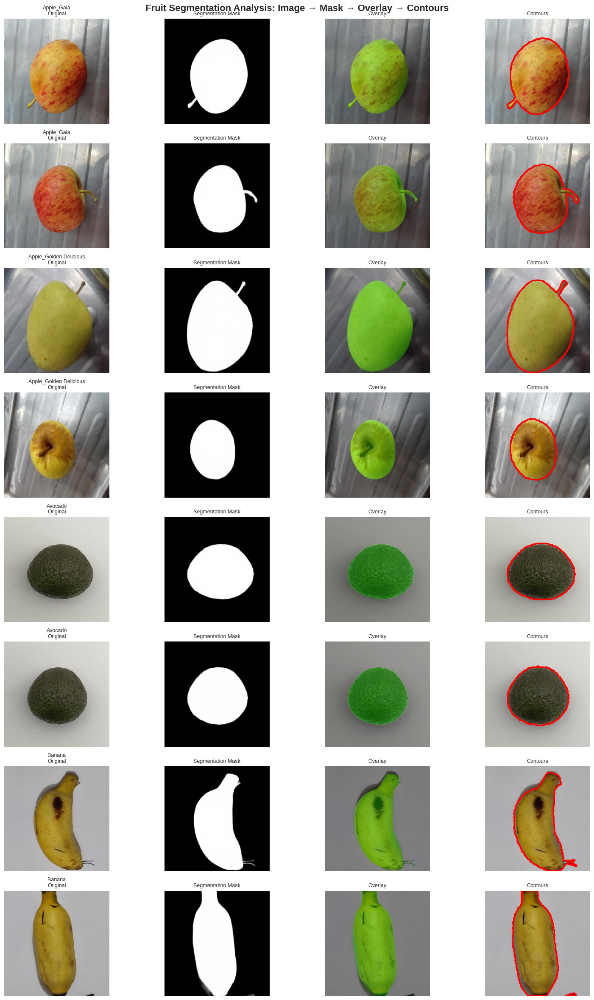

In [ ]:
# ========================================================================================
# 4. FRUIT SEGMENTATION VISUALIZATION (IMAGES + MASKS)
# ========================================================================================

def visualize_fruit_segmentation():
    """
    Advanced visualization of fruit images with their segmentation masks
    """
    # Load fruit images and masks
    fruit_images, fruit_masks, fruit_labels = load_fruit_images_and_masks(
        FRUIT_TRAIN_PATH, fruit_train_categories[:4], max_images_per_category=2
    )

    n_samples = min(8, len(fruit_images))
    fig, axes = plt.subplots(n_samples, 4, figsize=(16, n_samples * 3))
    fig.suptitle('Fruit Segmentation Analysis: Image → Mask → Overlay → Contours',
                 fontsize=16, fontweight='bold')

    for i in range(n_samples):
        img = fruit_images[i]
        mask = fruit_masks[i]
        label = fruit_labels[i]

        img_resized = cv2.resize(img, (224, 224))
        mask_resized = cv2.resize(mask, (224, 224))

        # Original image
        axes[i, 0].imshow(img_resized)
        axes[i, 0].set_title(f'{label}\nOriginal', fontsize=9)
        axes[i, 0].axis('off')

        # Binary mask
        axes[i, 1].imshow(mask_resized, cmap='gray')
        axes[i, 1].set_title('Segmentation Mask', fontsize=9)
        axes[i, 1].axis('off')

        # Overlay
        overlay = img_resized.copy()
        colored_mask = np.zeros_like(img_resized)
        colored_mask[:, :, 1] = mask_resized  # Green channel
        overlay = cv2.addWeighted(overlay, 0.7, colored_mask, 0.3, 0)
        axes[i, 2].imshow(overlay)
        axes[i, 2].set_title('Overlay', fontsize=9)
        axes[i, 2].axis('off')

        # Contours
        contours, _ = cv2.findContours(mask_resized, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
        img_contours = img_resized.copy()
        cv2.drawContours(img_contours, contours, -1, (255, 0, 0), 2)
        axes[i, 3].imshow(img_contours)
        axes[i, 3].set_title('Contours', fontsize=9)
        axes[i, 3].axis('off')

    plt.tight_layout()
    plt.show()

visualize_fruit_segmentation()

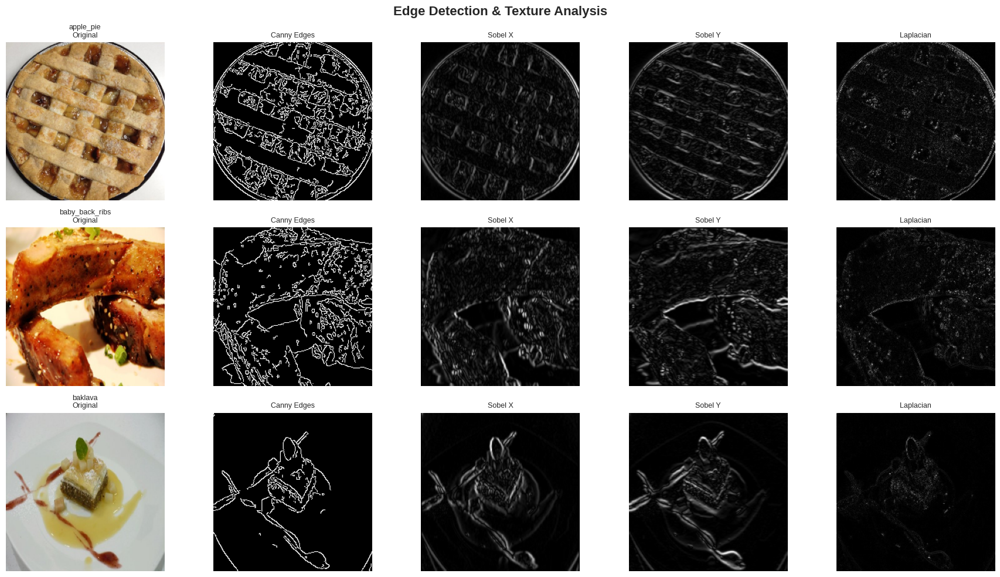

In [ ]:
# ========================================================================================
# 6. EDGE DETECTION & TEXTURE ANALYSIS
# ========================================================================================

def analyze_edges_and_texture():
    """
    Analyze edges and texture features
    """
    sample_images, labels = load_food_images(
        FOOD_TRAIN_PATH, food_train_categories[:3], max_images_per_category=1
    )

    fig, axes = plt.subplots(3, 5, figsize=(18, 10))
    fig.suptitle('Edge Detection & Texture Analysis', fontsize=16, fontweight='bold')

    for i, (img, label) in enumerate(zip(sample_images[:3], labels[:3])):
        img_resized = cv2.resize(img, (224, 224))
        gray = cv2.cvtColor(img_resized, cv2.COLOR_RGB2GRAY)

        # Original
        axes[i, 0].imshow(img_resized)
        axes[i, 0].set_title(f'{label}\nOriginal', fontsize=9)
        axes[i, 0].axis('off')

        # Canny edges
        edges = cv2.Canny(gray, 100, 200)
        axes[i, 1].imshow(edges, cmap='gray')
        axes[i, 1].set_title('Canny Edges', fontsize=9)
        axes[i, 1].axis('off')

        # Sobel X
        sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=5)
        axes[i, 2].imshow(np.abs(sobelx), cmap='gray')
        axes[i, 2].set_title('Sobel X', fontsize=9)
        axes[i, 2].axis('off')

        # Sobel Y
        sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=5)
        axes[i, 3].imshow(np.abs(sobely), cmap='gray')
        axes[i, 3].set_title('Sobel Y', fontsize=9)
        axes[i, 3].axis('off')

        # Laplacian
        laplacian = cv2.Laplacian(gray, cv2.CV_64F)
        axes[i, 4].imshow(np.abs(laplacian), cmap='gray')
        axes[i, 4].set_title('Laplacian', fontsize=9)
        axes[i, 4].axis('off')

    plt.tight_layout()
    plt.show()

analyze_edges_and_texture()

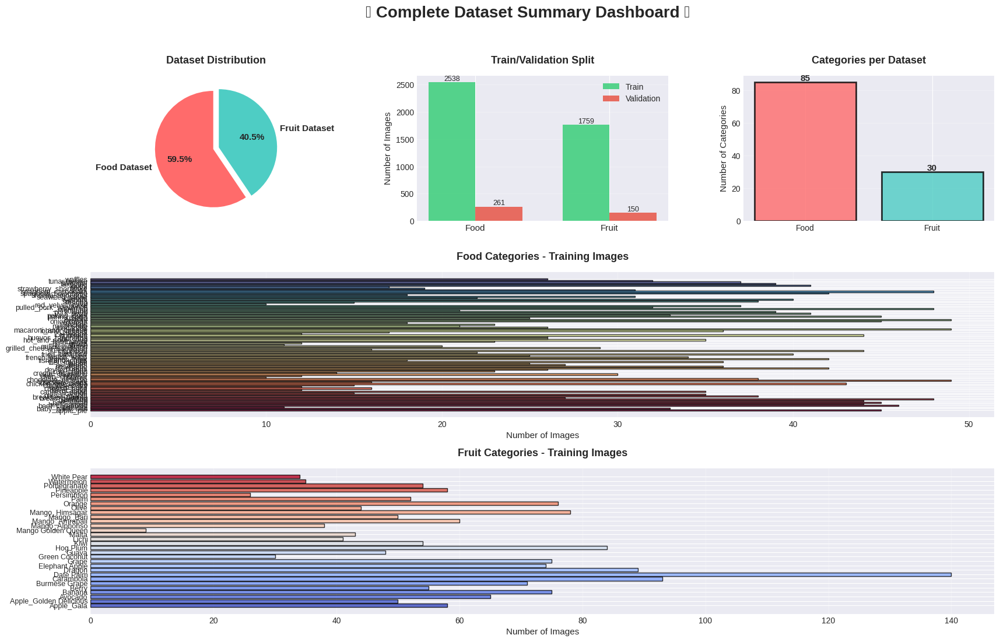

In [ ]:
# ========================================================================================
# 7. FINAL SUMMARY DASHBOARD
# ========================================================================================

def create_summary_dashboard():
    """
    Comprehensive summary dashboard
    """
    fig = plt.figure(figsize=(20, 12))
    gs = GridSpec(3, 3, figure=fig, hspace=0.35, wspace=0.3)

    fig.suptitle('🎯 Complete Dataset Summary Dashboard 🎯', fontsize=20, fontweight='bold', y=0.98)

    ax1 = fig.add_subplot(gs[0, 0])
    total_food = sum(dataset_stats['food']['train'].values()) + sum(dataset_stats['food']['val'].values())
    total_fruit = sum(dataset_stats['fruit']['train'].values()) + sum(dataset_stats['fruit']['val'].values())

    sizes = [total_food, total_fruit]
    labels_pie = ['Food Dataset', 'Fruit Dataset']
    colors_pie = ['#FF6B6B', '#4ECDC4']
    explode = (0.05, 0.05)

    wedges, texts, autotexts = ax1.pie(sizes, explode=explode, labels=labels_pie, colors=colors_pie,
                                         autopct='%1.1f%%', startangle=90, textprops={'fontsize': 11, 'weight': 'bold'})
    ax1.set_title('Dataset Distribution', fontsize=13, fontweight='bold', pad=15)

    ax2 = fig.add_subplot(gs[0, 1])
    food_train_total = sum(dataset_stats['food']['train'].values())
    food_val_total = sum(dataset_stats['food']['val'].values())
    fruit_train_total = sum(dataset_stats['fruit']['train'].values())
    fruit_val_total = sum(dataset_stats['fruit']['val'].values())

    x = np.arange(2)
    width = 0.35

    bars1 = ax2.bar(x - width/2, [food_train_total, fruit_train_total], width, label='Train', color='#2ECC71', alpha=0.8)
    bars2 = ax2.bar(x + width/2, [food_val_total, fruit_val_total], width, label='Validation', color='#E74C3C', alpha=0.8)

    ax2.set_xticks(x)
    ax2.set_xticklabels(['Food', 'Fruit'], fontsize=11)
    ax2.set_ylabel('Number of Images', fontsize=11)
    ax2.set_title('Train/Validation Split', fontsize=13, fontweight='bold', pad=15)
    ax2.legend(fontsize=10)
    ax2.grid(axis='y', alpha=0.3)

    for bars in [bars1, bars2]:
        for bar in bars:
            height = bar.get_height()
            ax2.text(bar.get_x() + bar.get_width()/2., height,
                    f'{int(height)}', ha='center', va='bottom', fontsize=9)

    ax3 = fig.add_subplot(gs[0, 2])
    cat_counts = [len(food_train_categories), len(fruit_train_categories)]
    bars = ax3.bar(['Food', 'Fruit'], cat_counts, color=['#FF6B6B', '#4ECDC4'], alpha=0.8, edgecolor='black', linewidth=2)
    ax3.set_ylabel('Number of Categories', fontsize=11)
    ax3.set_title('Categories per Dataset', fontsize=13, fontweight='bold', pad=15)
    ax3.grid(axis='y', alpha=0.3)

    for bar in bars:
        height = bar.get_height()
        ax3.text(bar.get_x() + bar.get_width()/2., height,
                f'{int(height)}', ha='center', va='bottom', fontsize=11, fontweight='bold')

    ax4 = fig.add_subplot(gs[1, :])
    food_counts = [dataset_stats['food']['train'][cat] for cat in food_train_categories]
    y_pos = np.arange(len(food_train_categories))
    colors_grad = plt.cm.Spectral(np.linspace(0, 1, len(food_train_categories)))

    bars = ax4.barh(y_pos, food_counts, color=colors_grad, alpha=0.8, edgecolor='black')
    ax4.set_yticks(y_pos)
    ax4.set_yticklabels(food_train_categories, fontsize=9)
    ax4.set_xlabel('Number of Images', fontsize=11)
    ax4.set_title('Food Categories - Training Images', fontsize=13, fontweight='bold', pad=15)
    ax4.grid(axis='x', alpha=0.3)

    ax5 = fig.add_subplot(gs[2, :])
    fruit_counts = [dataset_stats['fruit']['train'][cat] for cat in fruit_train_categories]
    y_pos_fruit = np.arange(len(fruit_train_categories))
    colors_grad2 = plt.cm.coolwarm(np.linspace(0, 1, len(fruit_train_categories)))

    bars = ax5.barh(y_pos_fruit, fruit_counts, color=colors_grad2, alpha=0.8, edgecolor='black')
    ax5.set_yticks(y_pos_fruit)
    ax5.set_yticklabels(fruit_train_categories, fontsize=9)
    ax5.set_xlabel('Number of Images', fontsize=11)
    ax5.set_title('Fruit Categories - Training Images', fontsize=13, fontweight='bold', pad=15)
    ax5.grid(axis='x', alpha=0.3)

    plt.show()

create_summary_dashboard()
